In [2]:
import torch
from tqdm import tqdm
import os
path = r"/home/sci/Disk_data/Datasets/TCGA-NSCLC-sub/FEATURES_level3/pt_files/"
path2 = r"/home/sci/Disk2/CPTAC-LUNG/FEATURES_level1/pt_files/"

for slide in tqdm(os.listdir(path)):
    slide_feat = torch.load(os.path.join(path, slide))
    print(slide_feat.shape)

100%|██████████| 828/828 [00:00<00:00, 9931.49it/s]

torch.Size([46, 1024])
torch.Size([32, 1024])
torch.Size([34, 1024])
torch.Size([96, 1024])
torch.Size([61, 1024])
torch.Size([78, 1024])
torch.Size([50, 1024])
torch.Size([80, 1024])
torch.Size([98, 1024])
torch.Size([78, 1024])
torch.Size([28, 1024])
torch.Size([67, 1024])
torch.Size([31, 1024])
torch.Size([80, 1024])
torch.Size([17, 1024])
torch.Size([64, 1024])
torch.Size([26, 1024])
torch.Size([66, 1024])
torch.Size([69, 1024])
torch.Size([56, 1024])
torch.Size([42, 1024])
torch.Size([67, 1024])
torch.Size([108, 1024])
torch.Size([38, 1024])
torch.Size([88, 1024])
torch.Size([73, 1024])
torch.Size([32, 1024])
torch.Size([40, 1024])
torch.Size([83, 1024])
torch.Size([69, 1024])
torch.Size([39, 1024])
torch.Size([58, 1024])
torch.Size([88, 1024])
torch.Size([46, 1024])
torch.Size([24, 1024])
torch.Size([89, 1024])
torch.Size([29, 1024])
torch.Size([84, 1024])
torch.Size([119, 1024])
torch.Size([80, 1024])
torch.Size([35, 1024])
torch.Size([25, 1024])
torch.Size([66, 1024])
torch.Siz

### Cluster K-Means

In [ ]:
from sklearn.cluster import KMeans
import numpy as np
import os
import torch
from tqdm import tqdm

# 假设 features 是你的特征数据（每行代表一个patch的特征向量）
path = r'/home/sci/Disk_data/Datasets/TCGA-NSCLC-sub/FEATURES_level1/pt_files/'
path2 = r"/home/sci/Disk2/CPTAC-LUNG/FEATURES_level1/pt_files"

# ----> 选择聚类数量
k = 10

for slide in tqdm(os.listdir(path2)):
    slide_feat = torch.load(os.path.join(path2, slide))
    slide_name = os.path.splitext(slide)[0]
    # 使用K均值聚类
    kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
    cluster_labels = kmeans.fit_predict(slide_feat)

    # 获取聚类中心的特征向量
    cluster_centers = kmeans.cluster_centers_

    # 将 NumPy 数组转换为 PyTorch tensor
    cluster_centers_tensor = torch.tensor(cluster_centers, dtype=torch.float32)
    cluster_labels_tensor = torch.tensor(cluster_labels, dtype=torch.float32)

    print(cluster_labels_tensor.size())
    print(cluster_centers_tensor)

    # # 将聚类中心保存到文件（以Numpy格式保存）
    # np.save(f'./dataset_cluster/TCGA/{slide_name}.pt', cluster_centers)
    # 保存聚类中心和簇标签为 .pt 文件
    # if not os.path.exists(f'./dataset_cluster/CPTAC/pt_files/{slide_name}.pt'):
    #     torch.save(cluster_centers_tensor, f'./dataset_cluster/CPTAC/pt_files/{slide_name}.pt')
    #     torch.save(cluster_labels_tensor, f'./dataset_cluster/CPTAC/label_files/{slide_name}.pt')

    # # 如果需要，你也可以保存簇标签（每个patch所属的聚类簇编号）
    # np.save('cluster_labels.npy', cluster_labels)
    # print(f'{slide_name} already saved')


t-sne

/home/sci/anaconda3/envs/lcf/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/sci/anaconda3/envs/lcf/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


4116
4116


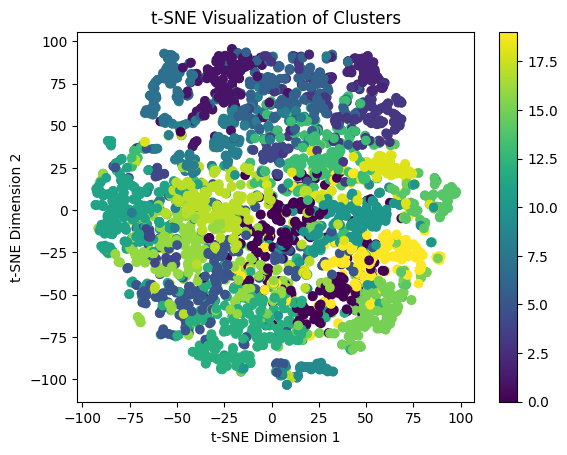

In [2]:
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import torch

# 假设 cluster_centers 是聚类中心，cluster_labels 是每个点的簇标签
cluster_centers = torch.load('/home/sci/Disk_data/Datasets/TCGA-NSCLC-sub/FEATURES_level1/pt_files/TCGA-4B-A93V-01Z-00-DX1.pt')  # 请根据实际情况加载数据
cluster_labels = torch.load('dataset_cluster/TCGA/label_files/TCGA-4B-A93V-01Z-00-DX1.pt')    # 请根据实际情况加载数据

# 使用 t-SNE 进行降维
tsne = TSNE(n_components=2, random_state=0,perplexity=5)
tsne_result = tsne.fit_transform(cluster_centers)
print(len(cluster_labels))
print(len(tsne_result))

# 绘制 t-SNE 可视化图
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=cluster_labels, cmap='viridis')
plt.title('t-SNE Visualization of Clusters')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.colorbar()
plt.show()

In [24]:
!CUDA_VISIBLE_DEVICES=0 python main.py --drop_out --early_stopping --lr 2e-4 --k 5 --label_frac 1\
--exp_code tcga_nsclc_sub_100_level3_mb --weighted_sample --bag_loss ce --inst_loss svm \
--task task_2_tumor_subtyping --model_type clam_mb --log_data --data_root_dir /home/sci/Disk_data/Datasets/TCGA-NSCLC-sub/FEATURES_level3 \
--split_dir /home/sci/Disk_data/SCI_Projects/chaofan/projects/CLAM/splits/tcga_nsclc_100 --subtyping \
--csv_path dataset_csv/tcga_lung_subtyping_sub.csv


Load Dataset
label column: label
label dictionary: {'LUAD': 0, 'LUSC': 1}
number of classes: 2
slide-level counts:  
 0    394
1    434
Name: label, dtype: int64
Patient-LVL; Number of samples registered in class 0: 333
Slide-LVL; Number of samples registered in class 0: 394
Patient-LVL; Number of samples registered in class 1: 400
Slide-LVL; Number of samples registered in class 1: 434
split_dir:  /home/sci/Disk_data/SCI_Projects/chaofan/projects/CLAM/splits/tcga_nsclc_100
Traceback (most recent call last):
  File "/home/sci/PycharmProjects/chaofan/projects/CLAM/main.py", line 202, in <module>
    assert os.path.isdir(args.split_dir)
AssertionError


### Feature Process

In [6]:
from sklearn.cluster import KMeans
import numpy as np
import os
import torch
from tqdm import tqdm

# 假设 features 是你的特征数据（每行代表一个patch的特征向量）
path = r'/home/sci/Disk_data/Datasets/TCGA-NSCLC-sub/FEATURES_level1/pt_files/'
path2 = r"/home/sci/Disk2/CPTAC-LUNG/FEATURES_level1/pt_files"

# ----> 选择聚类数量
k = 10

for slide in tqdm(os.listdir(path)):
    slide_feat = torch.load(os.path.join(path, slide))
    slide_name = os.path.splitext(slide)[0]
    # 使用K均值聚类
    kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
    cluster_labels = kmeans.fit_predict(slide_feat)

    # 获取聚类中心的特征向量
    cluster_centers = kmeans.cluster_centers_


    # 将每个聚类的特征组织成一个新的数据结构
    clustered_features = []
    for cluster_id in range(k):
        # 获取属于当前聚类的索引
        cluster_indices = np.where(cluster_labels == cluster_id)[0]
        # 获取属于当前聚类的特征
        cluster_features = slide_feat[cluster_indices, :]
        # 添加到新的数据结构中
        # clustered_features.append(torch.tensor(cluster_features, dtype=torch.float32).unsqueeze(0))
        clustered_features.append(cluster_features.tolist())
    
    # clustered_features_np = [np.array(cluster, dtype=np.float32) for cluster in clustered_features]
    # clustered_features_tensor = [torch.tensor(cluster, dtype=torch.float32) for cluster in clustered_features_np]
    
    print(clustered_features)
    
    clustered_features = torch.tensor(clustered_features)
    # 将新的数据结构保存为文件
    # torch.save(clustered_features, f'./dataset_cluster/tcga/pt_files/{slide_name}.pt')
    



  0%|          | 0/828 [00:00<?, ?it/s]

[[[0.11777374893426895, 0.005527580622583628, 0.0160952340811491, 0.028587020933628082, 0.013583771884441376, 0.00035673449747264385, 0.0895504280924797, 0.04004274308681488, 0.04853546619415283, 0.01191884558647871, 0.034508273005485535, 0.1447041928768158, 0.012488788925111294, 0.0398867130279541, 0.03285523131489754, 0.012392682023346424, 0.007560973986983299, 0.009724833071231842, 0.00026007936685346067, 0.11280789971351624, 0.0338522344827652, 0.013155234046280384, 0.011752769351005554, 0.058955948799848557, 0.003300953656435013, 0.06372454017400742, 0.021051902323961258, 0.009995125234127045, 0.011105431243777275, 0.00031375192338600755, 0.01723126322031021, 0.08195412158966064, 0.021962841972708702, 0.04555531218647957, 0.06407073140144348, 0.03168769180774689, 0.06664521247148514, 0.00021093315444886684, 0.0030417493544518948, 0.008399245329201221, 0.026898901909589767, 0.04940452054142952, 0.026837293058633804, 0.009968208149075508, 0.0005982394213788211, 0.003696032566949725,

ValueError: expected sequence of length 35 at dim 1 (got 90)

In [ ]:
import os
import logging 

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

import torch
import numpy as np
from tqdm import tqdm

# 保存PyTorch张量的工具函数
def save_pt(data, path):
    torch.save(data, path) 

# 配置日志  
logging.basicConfig(level=logging.INFO)

features = np.vstack([np.load(f) for f in feature_files])

# 标准化特征
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# 寻找最优k,绘制惯性图
ks = [2, 5, 10, 15, 20]
inertias = []
for k in ks:
    kmeans = KMeans(n_clusters=k, algorithm='elkan')
    kmeans.fit(scaled_features)
    inertias.append(kmeans.inertia_)
    logging.info(f'k={k}时的惯性为: {kmeans.inertia_}')

# 训练最终模型
kmeans = KMeans(n_clusters=10, algorithm='elkan') 
cluster_labels = kmeans.fit_predict(scaled_features)
cluster_centers = kmeans.cluster_centers_  

# 保存聚类结果,中心和标签
save_pt(cluster_labels, './clusters.pt')
save_pt(cluster_centers, './centers.pt') 

# 组织聚类后的特征  
clustered_features = [[] for _ in range(10)]
for i, label in enumerate(cluster_labels):
    clustered_features[label].append(features[i])

# 保存聚类后的特征
for i, cluster in enumerate(clustered_features):
    save_pt(cluster, f'./cluster_{i}.pt')

### Single Scale

tcga-nsclc

In [3]:
!CUDA_VISIBLE_DEVICES=0 python main.py --drop_out --early_stopping --lr 2e-4 --k 5 --label_frac 1 \
--exp_code tcga_nsclc_sub_100_level1_transmil+cluster --weighted_sample --bag_loss ce --inst_loss svm \
--task task_2_tumor_subtyping --model_type transmil --log_data --data_root_dir dataset_cluster/tcga \
--split_dir /home/sci/PycharmProjects/chaofan/projects/CLAM/splits/tcga_nsclc_100 --subtyping \
--csv_path dataset_csv/tcga_lung_subtyping_sub.csv


Load Dataset
label column: label
label dictionary: {'LUAD': 0, 'LUSC': 1}
number of classes: 2
slide-level counts:  
 0    394
1    434
Name: label, dtype: int64
Patient-LVL; Number of samples registered in class 0: 333
Slide-LVL; Number of samples registered in class 0: 394
Patient-LVL; Number of samples registered in class 1: 400
Slide-LVL; Number of samples registered in class 1: 434
split_dir:  /home/sci/PycharmProjects/chaofan/projects/CLAM/splits/tcga_nsclc_100
################# Settings ###################
num_splits:  5
k_start:  -1
k_end:  -1
task:  task_2_tumor_subtyping
max_epochs:  200
results_dir:  ./results
lr:  0.0002
experiment:  tcga_nsclc_sub_100_level1_transmil+cluster
reg:  1e-05
label_frac:  1.0
bag_loss:  ce
seed:  1
model_type:  transmil
model_size:  small
use_drop_out:  True
weighted_sample:  True
opt:  adam
bag_weight:  0.7
inst_loss:  svm
B:  8
split_dir:  /home/sci/PycharmProjects/chaofan/projects/CLAM/splits/tcga_nsclc_100

Training Fold 0!

Init train/val/

cptac-lung

In [2]:
!CUDA_VISIBLE_DEVICES=0 python main.py --drop_out --early_stopping --lr 2e-4 --k 5 --label_frac 1 \
--exp_code cptac_lung_100_level1_transmil+cluster --weighted_sample --bag_loss ce --inst_loss svm \
--task task_2_tumor_subtyping --model_type transmil --log_data --data_root_dir dataset_cluster/CPTAC \
--split_dir /home/sci/PycharmProjects/chaofan/projects/CLAM/splits/cptac_lung_100 --subtyping \
--csv_path dataset_csv/cptac_lung_subtyping.csv


Load Dataset
label column: label
label dictionary: {'LUAD': 0, 'LUSC': 1}
number of classes: 2
slide-level counts:  
 0    499
1    517
Name: label, dtype: int64
Patient-LVL; Number of samples registered in class 0: 160
Slide-LVL; Number of samples registered in class 0: 499
Patient-LVL; Number of samples registered in class 1: 157
Slide-LVL; Number of samples registered in class 1: 517
split_dir:  /home/sci/PycharmProjects/chaofan/projects/CLAM/splits/cptac_lung_100
################# Settings ###################
num_splits:  5
k_start:  -1
k_end:  -1
task:  task_2_tumor_subtyping
max_epochs:  200
results_dir:  ./results
lr:  0.0002
experiment:  cptac_lung_100_level1_transmil+cluster
reg:  1e-05
label_frac:  1.0
bag_loss:  ce
seed:  1
model_type:  transmil
model_size:  small
use_drop_out:  True
weighted_sample:  True
opt:  adam
bag_weight:  0.7
inst_loss:  svm
B:  8
split_dir:  /home/sci/PycharmProjects/chaofan/projects/CLAM/splits/cptac_lung_100

Training Fold 0!

Init train/val/test

In [8]:
!CUDA_VISIBLE_DEVICES=0 python main.py --drop_out --early_stopping --lr 2e-4 --k 5 --label_frac 1 \
--exp_code cptac_lung_100_level1_transmil+cluster --weighted_sample --bag_loss ce --inst_loss svm \
--task task_2_tumor_subtyping --model_type transmil --log_data --data_root_dir /home/sci/Disk2/CPTAC-LUNG/FEATURES_level1 \
--split_dir /home/sci/PycharmProjects/chaofan/projects/CLAM/splits/cptac_lung_100 --subtyping \
--csv_path dataset_csv/cptac_lung_subtyping.csv


Load Dataset
label column: label
label dictionary: {'LUAD': 0, 'LUSC': 1}
number of classes: 2
slide-level counts:  
 0    499
1    517
Name: label, dtype: int64
Patient-LVL; Number of samples registered in class 0: 160
Slide-LVL; Number of samples registered in class 0: 499
Patient-LVL; Number of samples registered in class 1: 157
Slide-LVL; Number of samples registered in class 1: 517
split_dir:  /home/sci/PycharmProjects/chaofan/projects/CLAM/splits/cptac_lung_100
################# Settings ###################
num_splits:  5
k_start:  -1
k_end:  -1
task:  task_2_tumor_subtyping
max_epochs:  200
results_dir:  ./results
lr:  0.0002
experiment:  cptac_lung_100_level1_transmil+cluster
reg:  1e-05
label_frac:  1.0
bag_loss:  ce
seed:  1
model_type:  transmil
model_size:  small
use_drop_out:  True
weighted_sample:  True
opt:  adam
bag_weight:  0.7
inst_loss:  svm
B:  8
split_dir:  /home/sci/PycharmProjects/chaofan/projects/CLAM/splits/cptac_lung_100

Training Fold 0!

Init train/val/test